Setup libraries

In [1]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray

Enter terminal and input `pip install osmnx`

Define catalogue

In [2]:
catalogue = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalogue)

In [3]:
min_lat = -18.155295
min_lon = 177.403231
max_lat = -18.131273065348047 
max_lon = 177.43468904098003
bbox = [min_lon, min_lat, max_lon, max_lat]

In [4]:
datetime="2024-03/2024-10"

In [5]:
dask_client = DaskClient(n_workers=1, threads_per_worker=16, memory_limit='16GB')

configure_s3_access(cloud_defaults=True, requester_pays=True)

In [6]:
# Define training data

gdf = gpd.read_file("marine_tdata_rf.geojson")
gdf = gdf.to_crs("EPSG:4326")
gdf.explore(column="class_id", legend=True)


In [7]:
print(len(gdf))

400


In [8]:
# Search through catalogue for relevant data
items = client.search(
    collections=["sentinel-2-c1-l2a"],
    bbox=bbox,
    datetime=datetime,
    query={"eo:cloud_cover":{"lt": 50}},
).item_collection()

print(f"Found {len(items)} items")


Found 55 items


In [9]:
items

In [10]:
# data = utils.load_data
data = load_data(items, bbox)

In [11]:
scaled = mask_and_scale(data)
scaled

<xarray.Dataset> Size: 145MB
Dimensions:      (time: 31, y: 268, x: 335)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int32 4B 32760
  * time         (time) datetime64[ns] 248B 2024-03-01T22:30:57.691000 ... 20...
Data variables: (12/13)
    red          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    green        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    blue         (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    nir08        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    swir16       (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    scl          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    ...           ...
    nir09        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    cloud        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge1     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge3     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge2     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    nir          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>

In [12]:
# scaled = scaled.fillna(0)  # Replace NaN with 0 (or use another value based on context)
# scaled = scaled.rio.write_crs("EPSG:4326", inplace=True)


In [13]:
print(scaled.isel(time=0).dims)

FrozenMappingWarningOnValuesAccess({'y': 268, 'x': 335})


In [14]:
print(scaled.dims)

FrozenMappingWarningOnValuesAccess({'time': 31, 'y': 268, 'x': 335})


In [15]:
scaled.isel(time=0).odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


In [16]:
# If your data is 4D (time, lat, lon, bands), slice the time dimension
# scaled.isel(time=0).odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


In [17]:
# median.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


In [18]:
# Create a median composite, which should get rid of most of the remaining clouds
# Note that this will take a few minutes to complete

median = scaled.median("time").compute()
median

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 268, x: 335)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int32 4B 32760
Data variables: (12/13)
    red          (y, x) float32 359kB 0.1314 0.1322 0.1313 ... 0.1642 0.1665
    green        (y, x) float32 359kB 0.1296 0.1293 0.1307 ... 0.2015 0.2105
    blue         (y, x) float32 359kB 0.1249 0.1229 0.1244 ... 0.1745 0.1812
    nir08        (y, x) float32 359kB 0.1457 0.1457 0.144 ... 0.1149 0.1156
    swir16       (y, x) float32 359kB 0.1139 0.1139 0.1163 ... 0.1153 0.1125
    scl          (y, x) float32 359kB 0.00065 0.00065 0.00065 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 359kB 0.142 0.142 0.142 ... 0.1099 0.1099 0.1094
    cloud        (y, x) float32 359kB 0.0065 0.0065 0.0065 ... 0.0049 0.0065
    rededge1     (y, x) float32 359kB 0.1423 0.1423 0.1431 ... 0.1729 0.1731
    rededge3     (y, x) float32 359kB 0.1447 0.1447 0.146 ... 0.1189 0.1203
    rededge2     (y, x) float32 359kB 0.137 0.137 0.1412 ... 0.1164 0.1162
    nir          (y, x) float32 359kB 0.1413 0.1431 0.1437 ... 0.1169 0.1154

In [19]:
median_image = median.assign_coords(band=["red", "green", "blue", "nir", "swir1", "swir2"])

In [20]:
# # import xarray as xr
# # import rioxarray

# # Ensure dataset is correctly structured (band, y, x)
# median_image = median_image.transpose("band", "y", "x")

# # Set CRS (replace with the correct CRS)
# median_image = median_image.rio.write_crs("EPSG:4326", inplace=True)

# # Export the dataset to GeoTIFF
# median_image.rio.to_raster("median_image.tif")


In [21]:
stacked = median.to_array(dim="band")
stacked.rio.to_raster("median_dataset.tif")

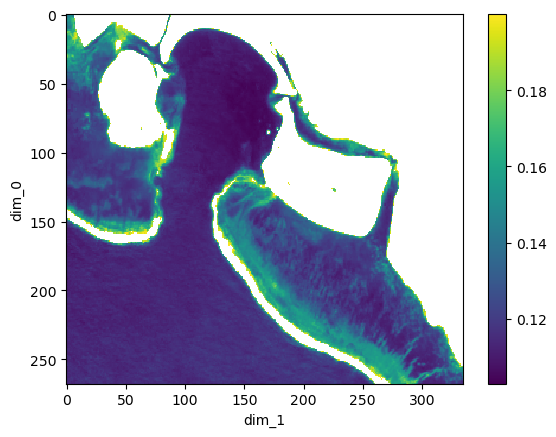

In [22]:
# Open the raster file
with rio.open('median_nir.tif') as src:
    band = src.read(1)  # Read the first band (e.g., NDVI)
    
# Define a threshold (e.g., NDVI > 0.2 is considered land)
land_mask = band < 0.2 # NDVI threshold for land

# Mask the raster to remove water (values below threshold)
masked_raster = np.ma.masked_where(~land_mask, band)

# Assuming masked_raster is a MaskedArray
masked_raster_da = xr.DataArray(masked_raster)

# Plot the DataArray using xarray's built-in plotting
masked_raster_da.plot.imshow(origin="upper")

In [23]:
# First transform the training points to the same CRS as the data
training = gdf.to_crs(median.odc.geobox.crs)

# Next get the X and Y values out of the point geometries
training_da = training.assign(x=training.geometry.x, y=training.geometry.y).to_xarray()

# Now we can use the x and y values (lon, lat) to extract values from the median composite
training_values = (
    median.sel(training_da[["x", "y"]], method="nearest").squeeze().compute().to_pandas()
)



In [24]:
# Join the training data with the extracted values and remove unnecessary columns
training_array = pd.concat([training["class_id"], training_values], axis=1)
training_array = training_array.drop(
    columns=[
        "y",
        "x",
        "spatial_ref",
    ]
)

# Drop rows where there was no data available
training_array = training_array.dropna()

# Preview our resulting training array
training_array.head()

,class_id,red,green,blue,nir08,swir16,scl,coastal,nir09,cloud,rededge1,rededge3,rededge2,nir
0,8,0.2252,0.25660,0.22440,0.15810,0.1485,0.0005,0.15790,0.15050,0.00650,0.1879,0.1655,0.16530,0.17540
1,7,0.1245,0.15320,0.14050,0.11100,0.1084,0.0006,0.13370,0.10740,0.00635,0.1360,0.1138,0.11280,0.10940
2,7,0.1290,0.15390,0.14050,0.11075,0.1080,0.0006,0.13335,0.10650,0.00650,0.1322,0.1106,0.11090,0.11195
3,7,0.1240,0.14615,0.13625,0.10835,0.1083,0.0006,0.13235,0.10555,0.00650,0.1316,0.1121,0.11045,0.10930
4,7,0.1215,0.14340,0.13370,0.11075,0.1080,0.0006,0.13335,0.10650,0.00650,0.1322,0.1106,0.11090,0.10880


In [25]:
# The classes are the first column
classes = np.array(training_array)[:, 0]

# The observation data is everything after the first column
observations = np.array(training_array)[:, 1:]

# Create a model...
classifier = RandomForestClassifier()

# ...and fit it to the data
model = classifier.fit(observations, classes)

In [26]:
# Convert to a stacked array of observations
stacked_arrays = median.to_array().stack(dims=["y", "x"]).transpose()

# Predict the classes
predicted = model.predict(stacked_arrays)

# Reshape back to the original 2D array
array = predicted.reshape(len(median.y), len(median.x))

# Convert to an xarray again, because it's easier to work with
predicted_da = xr.DataArray(
    array, coords={"y": median.y, "x": median.x}, dims=["y", "x"]
)

In [27]:
print(predicted_da.dtype)  # Check the dtype of your DataArray
predicted_da = predicted_da.astype('float32')  # Convert to float32

float64


In [28]:
# Put it all on a single interactive map
# center = [np.mean([min_lat[0], max_lat[0]]), np.mean([min_lat[1], max_lat[1]])]
# m = folium.Map(location=center, zoom_start=11)

center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]  # Assuming min_lon and max_lon are defined
m = folium.Map(location=center, zoom_start=13)



# RGB for the median
median.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=0.3).odc.add_to(m, name="Median Composite")


# Categorical for the predicted classes and for the training data
predicted_da.odc.add_to(m, name="Predicted")
gdf.explore(m=m, column="class_id", legend=True, name="Training Data")

# Layer control
folium.LayerControl().add_to(m)

m

In [29]:
predicted_da.odc.write_cog("predicted_randomforest_model_1.tif", overwrite=True)

PosixPath('predicted_randomforest_model_1.tif')

In [30]:
masked_data = predicted_da.where(masked_raster_da != 0)  # Mask out areas where mask = 0

In [34]:
masked_data

<xarray.DataArray (y: 268, x: 335, dim_0: 268, dim_1: 335)> Size: 32GB
array([[[[7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         ...,
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.]],

        [[7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         ...,
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.]],

        [[7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         ...,
...
         ...,
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.]],

        [[7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         ...,
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.]],

        [[7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         ...,
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.],
         [7., 7., 7., ..., 7., 7., 7.]]]], dtype=float32)
Coordinates:
  * y        (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x        (x) float64 3kB 5.426e+05 5.427e+05 5.427e+05 ... 5.46e+05 5.46e+05
Dimensions without coordinates: dim_0, dim_1

In [39]:
# Assuming 'masked_data' has a 'band' dimension, select a specific band (e.g., the first band)
masked_band = masked_data.isel(dim_1=1)  # Select the first band, adjust as needed

masked_band = masked_band.transpose('dim_0', 'y', 'x')

# Write it as a Cloud Optimized GeoTIFF (COG)
masked_band.rio.to_raster("masked_band.tif", overwrite=True)